# PROJET FIN D'ÉTUDES

# Gestion des risques de portefeuille: Covariance inconditionnelle et conditionnelle

### Introduction: Définition du sujet

Il existe plusieurs méthodes pour optimiser l’allocation d’actifs dans un portefeuille, parmi les plus connues on retrouve: Minimum Variance, Maximum Diversification et Equal Risk Contribution. Ces trois méthodes se basent sur le risque en utilisant l’optimisation de la variance.

La variance mesure la distance ou l'étalement des nombres d'un ensemble de données par rapport à la moyenne. Lors de l'analyse d'un portefeuille d'investissement, la variance peut montrer comment les rendements d'un titre sont répartis au cours d'une période donnée.

Lors de la création d'une stratégie d'investissement, l'objectif de chaque investisseur est de créer un portefeuille d'actions offrant les rendements à long terme les plus élevés sans entrer dans des niveaux de risque élevés. La théorie moderne du portefeuille, qui inclut l'analyse de la variance, est basée sur l'idée que les investisseurs sont averses au risque. Par conséquent, ils se concentrent sur la création d'un portefeuille qui optimise le rendement attendu en fonction d'un niveau de risque spécifique. 


De plus pour calculer la variance on utilise la matrice de covariance du portefeuille. Il existe deux approches différentes de calcul de covariance: covariance inconditionnelle et la covariance conditionnelle. Dans ce projet nous allons comparer ces deux approches (parler des incovénients et avantages avec des exemples) et les appliquer sur un historique de rendements d'actifs de l'indice S&P 500. Dans un dernier temps, nous évoquerons d'autres stratégies annexes pour ameliorer ces deux approches.

In [1]:
#Importation des librairires nécéssaires

import pandas as pd
import numpy as np
import statsmodels.api as sm
import plotly.express as px
import plotly.figure_factory as ff
from arch import arch_model

from ipywidgets import HBox, VBox
from scipy.optimize import fmin, minimize
from scipy.stats import t
from scipy.stats import norm
from math import inf

import bs4 as bs
import requests
import yfinance as yf
import datetime

In [2]:
# Téléchargment de 10 ans de données de prix pour les actifs du S&P 500

resp = requests.get('http://en.wikipedia.org/wiki/List_of_S%26P_500_companies')
soup = bs.BeautifulSoup(resp.text, 'lxml')
table = soup.find('table', {'class': 'wikitable sortable'})
tickers = []
for row in table.findAll('tr')[1:]:
    ticker = row.findAll('td')[0].text
    tickers.append(ticker)

tickers = [s.replace('\n', '') for s in tickers]
start = datetime.datetime(2010,1,1)
end = datetime.datetime(2020,12,30)
close_prices = yf.download(tickers, start=start, end=end)['Adj Close']

[*********************100%***********************]  505 of 505 completed

3 Failed downloads:
- BRK.B: No data found, symbol may be delisted
- BF.B: None
- OGN: Data doesn't exist for startDate = 1262300400, endDate = 1609282800


In [3]:
close_prices.head()

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,...,XEL,XLNX,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2009-12-31,20.311489,4.562870,38.689663,6.471692,NaN,21.707577,8.73,19.677296,32.967911,36.779999,...,14.068967,19.544056,43.058205,32.621960,NaN,19.924925,54.410439,28.350000,11.005653,NaN
2010-01-04,20.461845,4.496876,38.594082,6.572423,NaN,22.173862,8.74,19.848595,33.420715,37.090000,...,13.976151,19.793619,43.664387,32.770370,NaN,19.993296,55.248112,28.670000,11.434562,NaN
2010-01-05,20.239574,5.005957,38.364689,6.583786,NaN,22.015656,8.53,19.688225,33.627262,37.700001,...,13.810403,19.544056,43.834881,32.380802,NaN,19.924925,56.997040,28.620001,11.837729,NaN
2010-01-06,20.167667,4.798555,38.699211,6.479064,NaN,21.807484,8.40,19.797564,33.984741,37.619999,...,13.836921,19.411470,44.213745,32.594124,NaN,19.782482,56.978634,28.400000,12.867097,NaN
2010-01-07,20.141520,4.939965,38.689663,6.467087,NaN,21.457769,8.40,19.961575,33.952976,36.889999,...,13.777250,19.216499,44.074821,33.020805,NaN,19.776789,58.285736,27.690001,14.308208,NaN


In [4]:
# Calcul des rendements des actifs
rets = ((close_prices / close_prices.shift(1)) - 1 ).dropna(how='all') * 100 #drompna Remove missing values.

In [5]:
rets.head()

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,...,XEL,XLNX,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2010-01-04,0.740252,-1.446312,-0.247045,1.556492,NaN,2.148032,0.114550,0.870541,1.373471,0.842853,...,-0.659724,1.276926,1.407820,0.454941,NaN,0.343142,1.539545,1.128747,3.897164,NaN
2010-01-05,-1.086270,11.320767,-0.594374,0.172889,NaN,-0.713484,-2.402746,-0.807966,0.618020,1.644650,...,-1.185932,-1.260827,0.390465,-1.188782,NaN,-0.341969,3.165589,-0.174396,3.525861,NaN
2010-01-06,-0.355279,-4.143108,0.871953,-1.590605,NaN,-0.945563,-1.524034,0.555351,1.063063,-0.212206,...,0.192014,-0.678393,0.864299,0.658791,NaN,-0.714897,-0.032293,-0.768697,8.695658,NaN
2010-01-07,-0.129652,2.946936,-0.024673,-0.184860,NaN,-1.603643,0.000000,0.828440,-0.093468,-1.940456,...,-0.431241,-1.004412,-0.314209,1.309075,NaN,-0.028780,2.294022,-2.499997,11.199967,NaN
2010-01-08,-0.032481,-1.908414,0.395237,0.664813,NaN,1.086546,-2.023811,0.511217,-0.397750,-0.542154,...,0.048088,1.461055,-0.401153,0.000000,NaN,0.028788,-2.100429,-0.325028,-1.618670,NaN


Rendement cumulé des 50 premières actifs:
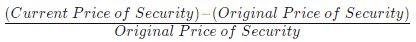

In [6]:
cum_rets = close_prices / close_prices.iloc[0,:]

In [7]:
#Representation of the cumulative return of the first 50
fig = px.line(cum_rets.iloc[:,:50], width=1000, height=500)
fig.show()

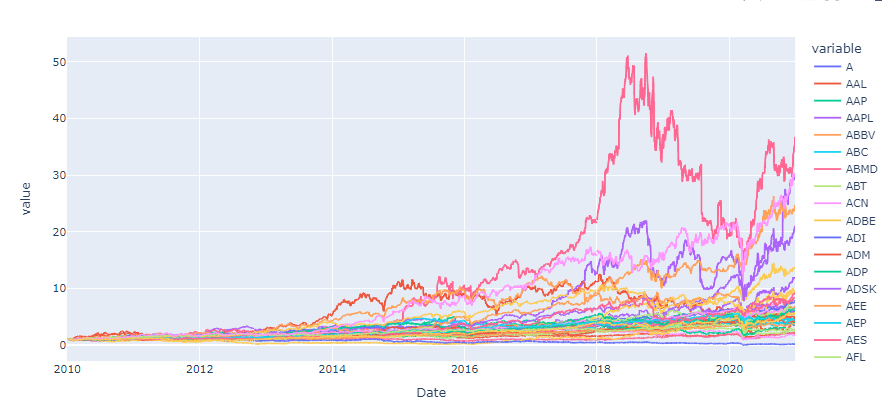

# 1 Covariance inconditionnelle

Utiliser une covariance inconditionnelle signifie que la covariance ne dépend pas du temps. Avec la covariance inconditionnelle une approche classique pour simuler des données serait:
- Trouver des rendements normalement distribués.
- Calculer la moyenne et écart type de ces rendements.
- Utiliser ces deux caractéristiques pour simuler les données.


### 1.1 Simulation des données de netflix basées sur la moyenne et la variance

In [9]:
return_dist_plot  = ff.create_distplot([rets['NFLX'].values.reshape(-1)], group_labels = [' '])
return_dist_plot.update_layout(showlegend=False, title_text='Distribution des rendements de Netflix', width=1000, height=500)
return_dist_plot.show()

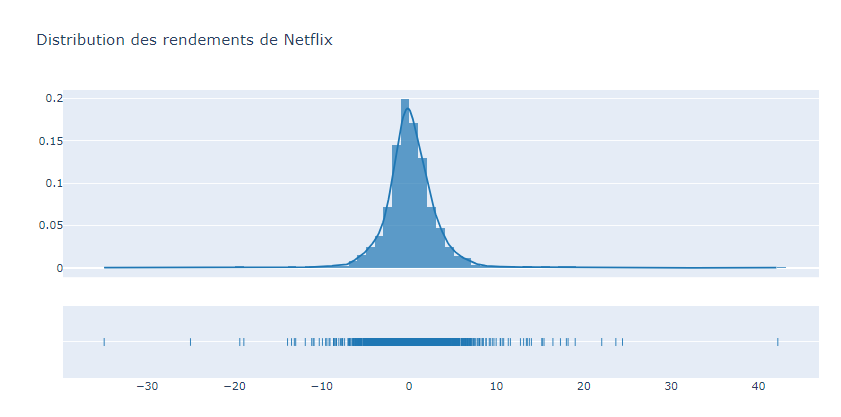

Nous constatons que les données suivent une distribution normale, nous allons donc utiliser np.random.normal pour simuler les rendement:

In [10]:
mean_rets = pd.DataFrame(rets.mean(), columns = ['Mean Return'])
sim_mean = mean_rets.loc['NFLX']
vol_daily = pd.DataFrame(rets.std().dropna(),columns = ['Vol'])
sim_std = vol_daily.loc['NFLX']
sim_rets = pd.DataFrame(np.random.normal(sim_mean, sim_std, len(rets)), columns = ['Sim Rets'], index = rets.index)
sim_rets.head()

,Sim Rets
Date,
2010-01-04,-7.523577
2010-01-05,3.163303
2010-01-06,5.164422
2010-01-07,-1.169949
2010-01-08,0.244154


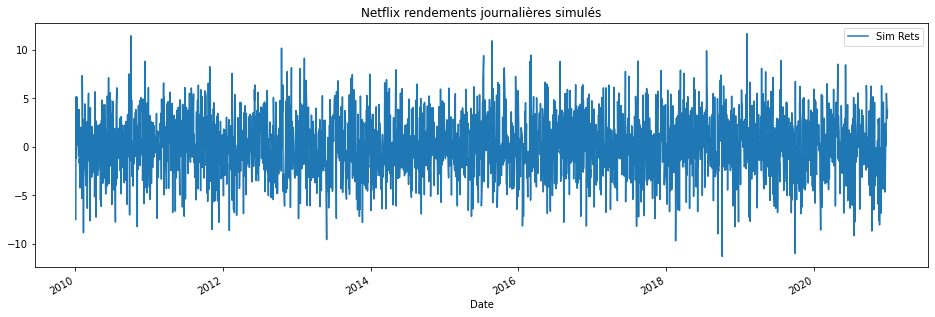

In [12]:
sim_rets.plot(figsize =(16,5), title = 'Netflix rendements journalières simulés');

En regardant cette courbe ci-dessus, on peut observer un phénomène: <br><br>
    -Une séquence homoscédasticité, homogénéité de la variance

Affichons maintenant les "vrai" rendements journalièree de cette action:

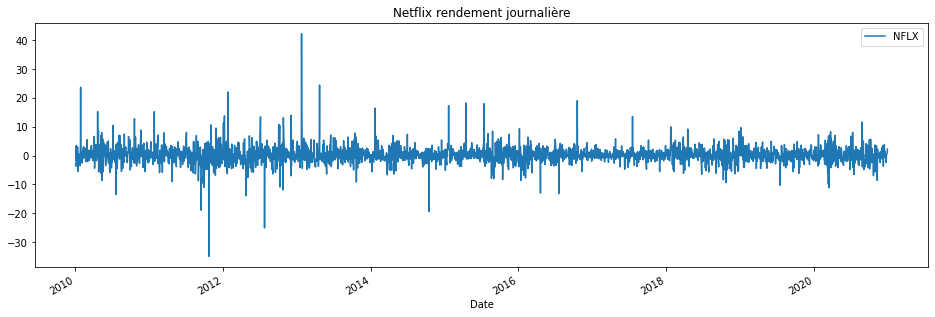

In [57]:
rets[['NFLX']].plot(figsize =(16,5), title = 'Netflix rendement journalières');

En regardant cette courbe ci-dessus, on peut observer 2 phénomènes; <br><br>
    -Volatility Clustering, périodes concentrées où la volatilité est assez élevée et des périodes où elle est basse. <br><br>
    -Séquence hétéroscédastique, une variance non constante, nous voyons beaucoup de pics et de creux.<br><br>

In [19]:
vol_annual = pd.DataFrame(rets.std().dropna() * 16,columns = ['Vol'])
print('Volatilité de Netflix est {vol}%'.format(vol =round(vol_annual.loc['NFLX'].values[0],2)))
print('La volatilité des séries simulées est {vol}%'.format(vol =round(sim_rets.std().values[0]*16,2)))

Volatilité de Netflix est 51.83%
La volatilité des séries simulées est 50.76%


Les deux méthodes ont la même valeur moyenne mais n'ont pas la même allure graphiquement.

Conclusion: <br> <br>
La covariance inconditionnelle semble très intuitive et rapide mais possède plusieurs inconvénients: <br>
<br>
-Premièrement, cette estimation du risque par variance n'est appropriée que lorsque les rendements sont normalement distribués. <br>
<br>
-Deuxièmement, on néglige beaucoup d’autres caractéristiques qui sont aussi importantes que la moyenne et la variance, on manque donc de beaucoup d'informations ce qui rend la simulation très assez éloigné de la réalité comme on peut constater avec les deux graphiques.

## 2 Autocorrélation des paramètres

### 2.1 Autocorrélation journalière ?

Le rendements d'un jour a-t-il un impact sur le rendement du lendemain ?

In [13]:
acf_rets = px.bar(pd.DataFrame(sm.tsa.stattools.acf(rets['BA'], fft=False)), title="Autocorrelation des rendements de l'action BA", width=1000, height=500)
acf_rets.update_layout(showlegend=False)
acf_rets.show()

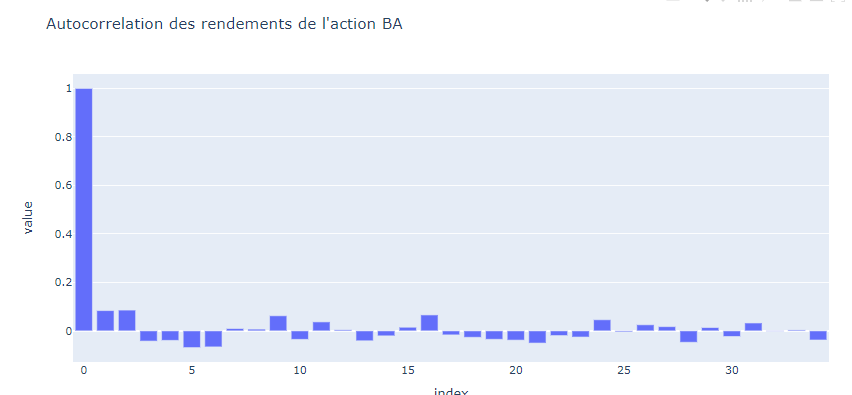

On constate une autocorrélation des rendements très petite entre jour j et jour j+1.

On va regarder l'autocorrélation des rendements de tous les actifs et les trier par ordre décroissant:

In [14]:
acf = lambda x: sm.tsa.stattools.acf(x, fft=False)[1]
acf_rets_all = pd.DataFrame(rets.apply(acf), columns=['ACF Rets']).dropna()
acf_rets_all.sort_values(ascending=False, by='ACF Rets', inplace=True)
acf_rets_all_plot = px.bar(acf_rets_all, title = 'Autocorrélation des rendements pour tous les actifs', width=1000, height=500)
acf_rets_all_plot.update_layout(showlegend=False)
acf_rets_all_plot.show()

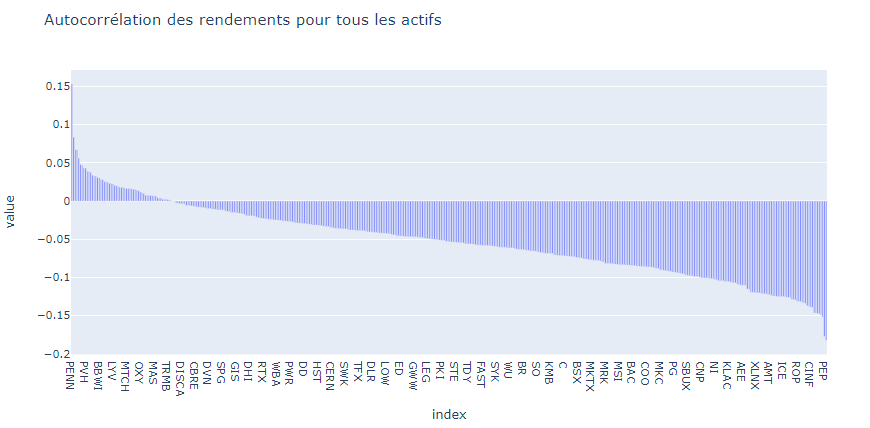

On constate que tous les actions ont une autocorrélation de rendements très basse voir négative (autocorrélation négative signifie que les rendements entre le jour j et jour j+1 sont opposés).

### 2.2 Autocorrélation de la volatilité ?

La volatilité d'un jour a-t-il un impact sur celle du lendemain ?

On sait que les rendements au carré sont une bonne approximation de la variance/volatilité, car: <br>

La volatilité se définit tel que: <br> 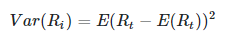 <br>

Si on utilise des données quotidiennes pour calculer la variance, alors le deuxième terme : E(Rt)≈0 <br>

Et on trouve: 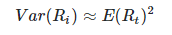

In [15]:
acf_rets_sq = px.bar(pd.DataFrame(sm.tsa.stattools.acf(rets['BA']**2, fft=False)), title="Autocorrelation de la volatilité de l'action BA", width=1000, height=500)
acf_rets_sq.update_layout(showlegend=False)
acf_rets_sq.show()

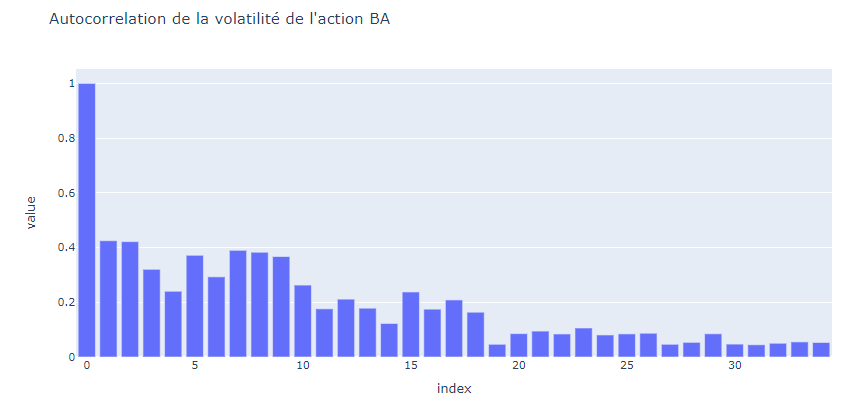

Ici, on constate une autocorrélation de la volatilité assez élèvée pour l'actif BA.

On va regarder l'autocorrélation des volatilités de tous les actifs et les trier par ordre décroissant:

In [17]:
acf = lambda x: sm.tsa.stattools.acf(x, fft=False)[1]
acf_rets_sq_all = pd.DataFrame((rets**2).apply(acf), columns=['ACF Rets Sq']).dropna()
acf_rets_sq_all.sort_values(ascending=False, by='ACF Rets Sq', inplace=True)
acf_rets_sq_all_plot = px.bar(acf_rets_sq_all,  title = "Autocorrélation de la volatilité pour tous les actifs", width=1000, height=500)
acf_rets_sq_all_plot.update_layout(showlegend=False)
acf_rets_sq_all_plot.show()

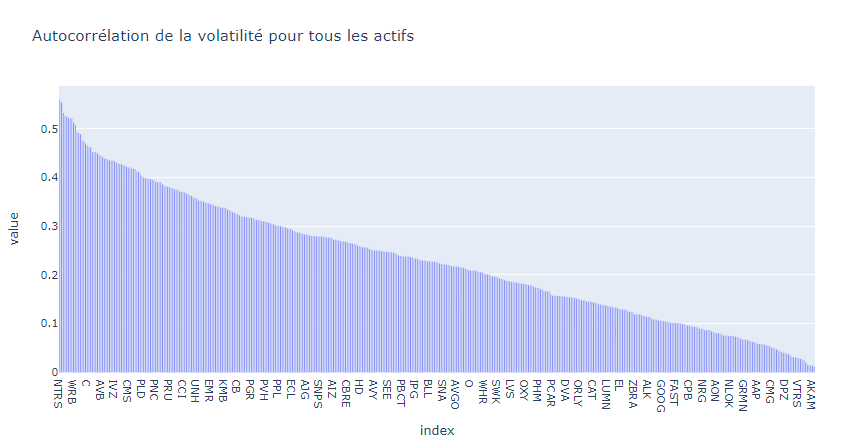

On constate que la majorité des actifs ont une autocorrélation de la volatilité assez élevée. <br> <br>
Ce graphique nous montre le phénomène qu'on avait vu avec l'actif Netflix: "Volatilty clustering" est présent dans l'ensemble des actions.

### Comment pouvons-nous prendre cela en considération?
### En utilisant la variance conditionnelle

# 3 Covariance conditionnelle

Avec la covariance conditionnelle on tient en compte le temps et par conséquent le "Volatility Clustering". Pour la calculer on va utiliser le modèle GARCH.

## 3.1 GARCH

La matrice de covariance conditionnelle est calculée à partir d'un modèle de type GARCH et qui dépend des informations disponibles à ce jour.  Il s'agit d'un donc de modèle qui permet d'estimer et prévoir la volatilité du prix d'un action ou d'un rendement à court terme en se basant sur les valeurs que prennent ces prix ou rendements quelques périodes de temps auparavant.

<br>

Garch est un acronymes  qui signifie:
<br>

    -Generalised: un modèle ARCH généralisé.
<br>

    -AutoRegressive: la volatilité d'un jour influence la volatilité du jour suivant.
<br>

    -Conditional: la période de temps qu'on considère est à tenir en compte.
<br>

    -Heteroskedastic: la volatilité n'est pas plate, elle varie de haut en bas.

On va utiliser le modèle GARCH(1,1): <br>
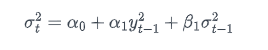

<br>

$\sigma^2_t$ est la volatilité au temps $t$ qui dépend de: <br>
- $\sigma^2_{t-1}$ est la volatilité au temps $t-1$
- $y^2_{t-1}$ est la valeur de la sértie au temps $t-1$
- $\alpha_0$, $\alpha_1$ et $\beta_1$ sont les les paramètres du modèle 

In [22]:
#Application du modèle GARCH(1,1) avec distribution Student, 
#Les rendements financiers sont souvent à queue épaisse, et une distribution T de Student est une méthode simple
#pour capturer cette caractéristique.
am = arch_model(rets['AAPL'], dist = 't')
garch_output = am.fit(disp='off')
garch_output.summary

<bound method ARCHModelResult.summary of                         Constant Mean - GARCH Model Results                         
Dep. Variable:                         AAPL   R-squared:                       0.000
Mean Model:                   Constant Mean   Adj. R-squared:                  0.000
Vol Model:                            GARCH   Log-Likelihood:               -5134.57
Distribution:      Standardized Student's t   AIC:                           10279.1
Method:                  Maximum Likelihood   BIC:                           10308.8
                                              No. Observations:                 2763
Date:                      Tue, Dec 14 2021   Df Residuals:                     2762
Time:                              18:29:54   Df Model:                            1
                               Mean Model                               
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------

In [19]:
stock_garch =  pd.DataFrame(garch_output.conditional_volatility)*16
garch_plot = px.line(stock_garch, title = 'Volatilité GARCH des rendements journalières', width=1000, height=500)
garch_plot.update_layout(showlegend=False)
garch_plot.show()

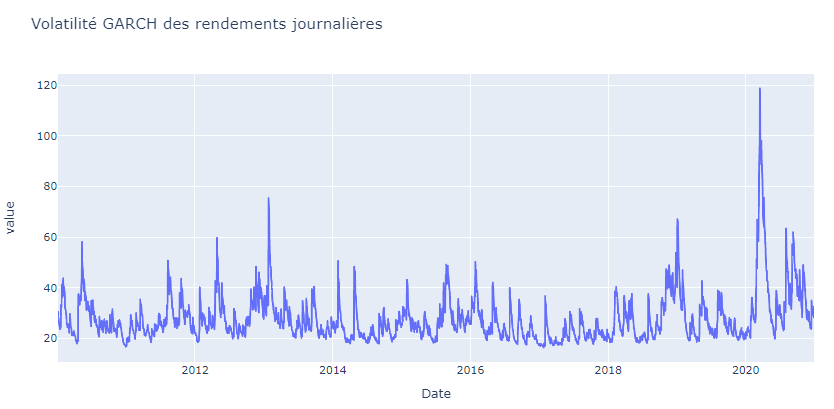

Avec le modèle GARCH on retrouve une simulation des données beaucoup plus proche comparée à celle obtenue avec la méthode inconditionnelle. On retrouve bien séquence hétéroscédastique, une variance non constante, nous voyons beaucoup de pics et de creux, et par conséquent le phénomène de "volatility clustering".

## 3.2 Comparaison de la covariance conditionnelle (avec Garch) avec covariance inconditionnelle

In [20]:
stock_garch['Vol'] = vol_daily.loc['BA',:][0]*16
garch_plot = px.line(stock_garch, title = 'Volatilité Garch vs Volatilité Inconditionelle', width=1000, height=500)
garch_plot.show()

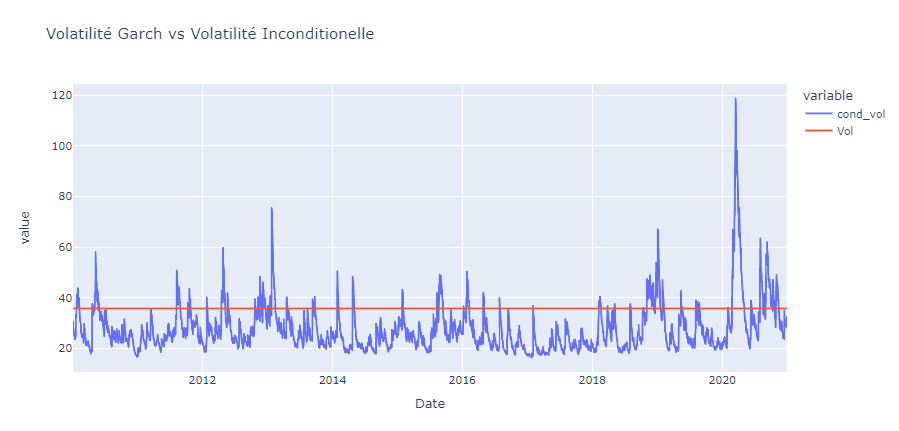

On constate la grande différence de précision, avec la volatilité inconditionnelle on a une sorte de moyenne et on perd beaucoup d'informations comment par exemple le grand pic qu'il y a eu en début de l'année 2020.

### Y-a-t-il des altenatives pour améliorer la précision ?

#### L'utilisation de fenêtres glissantes

### 3.3 Fenêtres glissantes

Les fenêtres glissantes consistent à mettre à jour son portefeuille au cours du temps: <br>

« Fenêtre mobile » signifie simplement qu'on applique la méthode ou le modèle qu'on utilise à plusieurs reprises à un sous-ensembles de données notre ensemble de données:

1) On choisit une taille  M ( M un entier) pour taille du sous-ensemble qu'on veut étudier
<br>
2) On choisit une période H (avec H en entier) pour laquelle on va réétudier les données au cours du temps. 

<br>


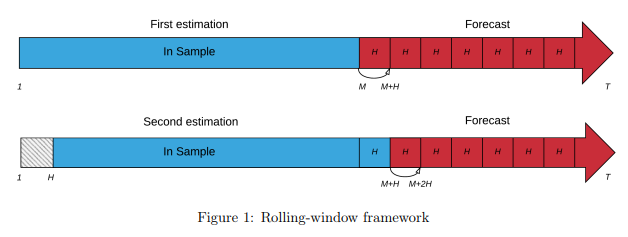

### 3.3.1 Comparaison entre conditionnelle et inconditionnelle en utilisant rolling windows

In [21]:
garch_and_rolling_std = pd.concat([pd.DataFrame(garch_output.conditional_volatility*16),rets[['BA']].rolling(window=22, min_periods=22).std()*16], axis=1).dropna()
garch_and_rolling_std_plot = px.line(garch_and_rolling_std, title = 'GARCH vs Inconditionnelle avec fêntetres glissantes', width=1000, height=500)
garch_and_rolling_std_plot.show()

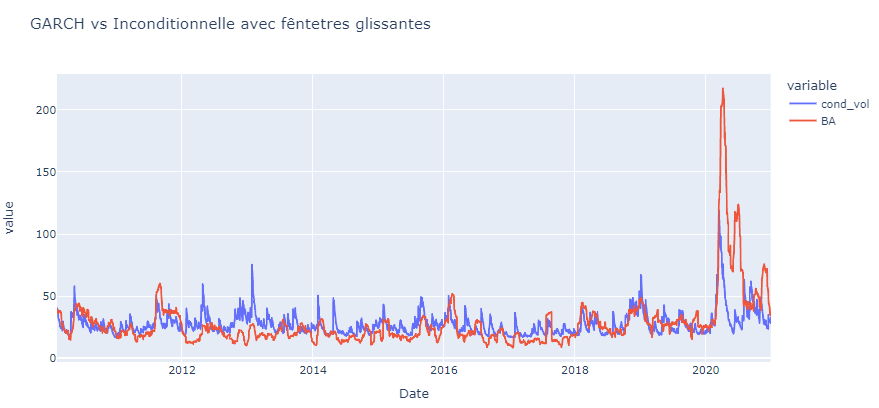

On constate qu'avec la fenêtre glissante on trouve des meilleurs résultats pour la méthode inconditionnelle, les résultats de celle-ci sont même très similaires aux résultats de la méthode conditionnelle.

### 3.3.2 Le problème avec l'utilisation d'une fenêtre roulante
Tous les actifs reçoivent une pondération égale, ce qui peut créer d'importantes distorsions.

## Prochaines étapes:

    -Appliquer DCC (Dynamic Conditional Correlation) pour remedier la pondération égale.
    -Ou trouver une autre méthode